# Rare Events, Adaptive Umbrella Sampling, and Metadynamics

This notebook tries to illustrate the concept of a rare event, the logic behind employing an umbrella potential, and Metadynamics (both the plain and the well-tempered version). Everything is implemented trying to keep things as simple as possible. The notebook relies on `numpy`, `matplotlib`, `scipy`, and `tqdm`.

In [1]:
import numpy as np

%matplotlib inline
import matplotlib as mpl
import matplotlib.pyplot as plt

from tqdm import tqdm


In [2]:
# Set a random seed for reproducibility
np.random.seed(2021)
# Resolution for the various images
mpl.rc('figure', dpi=200)

Everything will be performed on a small toy system. The system we consider is 1D. We use the following functional form for the potential energy:

\begin{equation}
U(x) = ax^4 - 6x^2 + x
\end{equation}

with $a=0.5$, $b=-6$, and $c=1$.
It follows that we have a very simple expression for the force:

\begin{equation}
f(x) = -\frac{dU(x)}{dx} = -2x^3 + 12x - 1
\end{equation}

In [3]:
def potential_energy(x):
    '''Compute the value of the potential energy'''
    return 0.5*x**4 - 6*x**2 + x

def force(x):
    '''Compute the force from the potential energy'''
    return -2*x**3 + 12*x - 1


The potential energy has the following look:

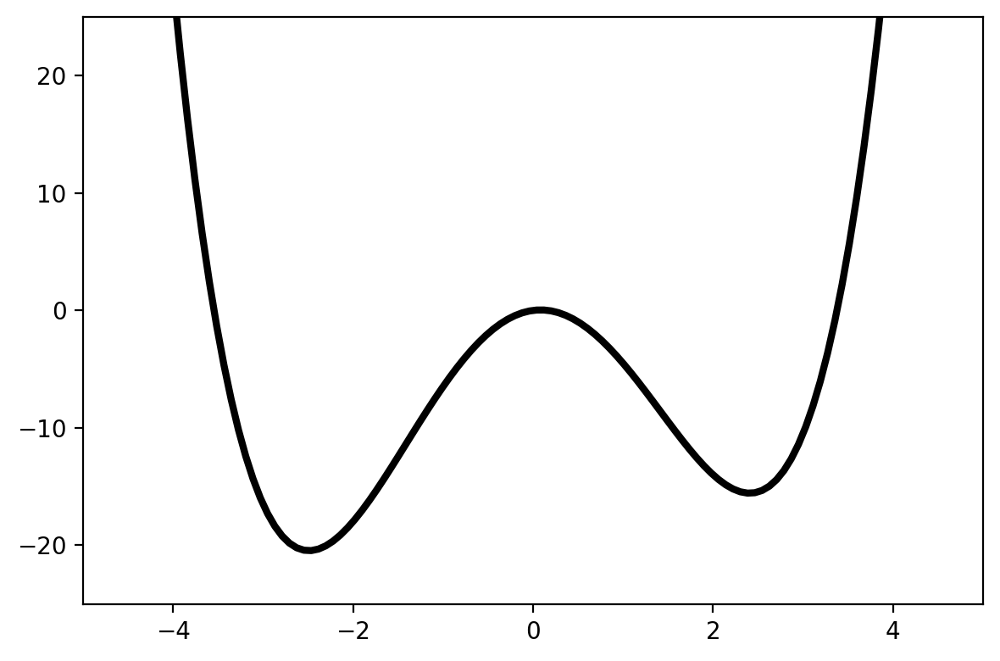

In [4]:
# Evaluate the potential energy over a grid spanning from -4 to +4 (100 bins)
xx = np.linspace(-4,4,100)
U = potential_energy(xx)

def plot_U(xx, U):
    '''Plot the potential energy'''
    plt.plot(xx, U, lw=3.0, c='k')
    plt.xlim(-5,5)
    plt.ylim(-25,25)
    plt.tight_layout()
    
plot_U(xx, U)


Then we define a simple `System` class. It's nothing more than a container with the initial coordinates and an attribute `traj` that will store the trajectory

In [5]:
class System():
    
    def __init__(self, x0, p0, m, kbT):
        self.x0 = x0
        self.p0 = p0
        self.m = m
        self.kbT = kbT
        # Also initialize a list that will
        # store the trajectory.
        self.traj = [x0]


We can now initialize our system. We initialize it in the basin on the right (`x0 = 2.4`), with no initial velocity (`p0 = 0.0`), with mass equal to one (`m = 1`), and with a small $k_bT$ (`kbT = 1e-2`)

In [6]:
# Settings for the `System`
x0 = 2.4
p0 = 0.0
m = 1.0
kbT = 1e-2

# Initialize the system
system = System(x0=x0, p0=p0, m=m, kbT=kbT)


We can take a look at it

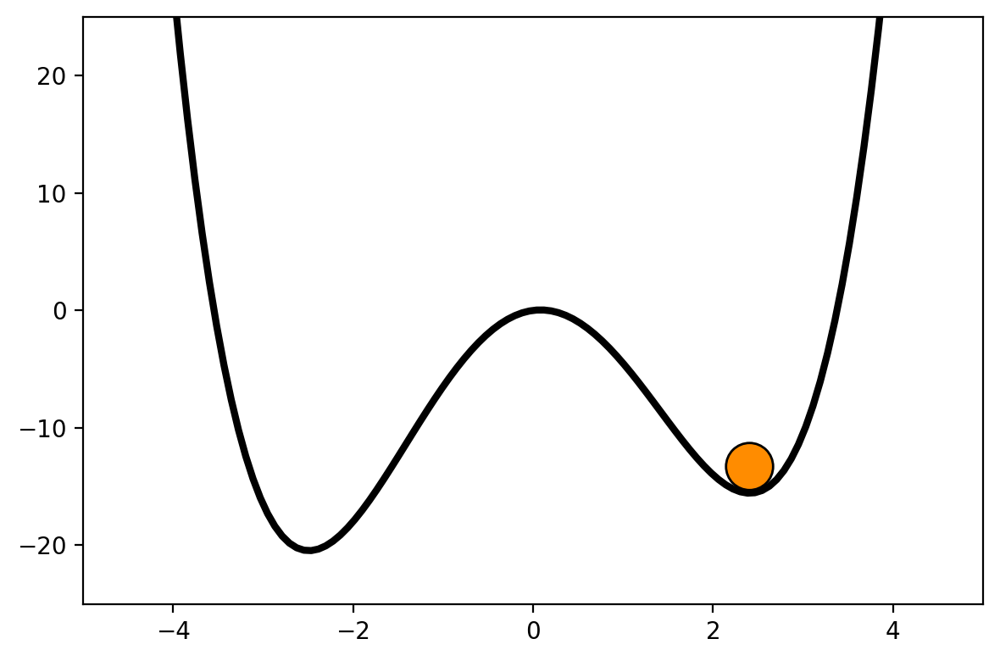

In [7]:
def plot_point_on_U(x, xx, U, shift=2.3):
    '''Plot the system over U'''
    plot_U(xx,U)
    plt.plot(x,potential_energy(x0)+shift, 'o', markersize=20, markeredgecolor='k', color='darkorange')
    
plot_point_on_U(system.x0, xx, U)


Here we define a simple class that represents a molecular dynamics engine. We simulate our system in the NVT ensemble, by means of the Langevin equations of motions (Langevin dynamics). We integrate the equations of motions using the BAOAB method.

\begin{align}
p(t+\frac{1}{2}\delta t) &= p(t) + \frac{1}{2}\delta t f(f)  &B\\
x(t + \frac{1}{2}\delta t) &= x(t) + \frac{1}{2}\delta t p(t + \frac{1}{2}\delta t)/m &A \\
p'(t+\frac{1}{2}\delta t) &= \exp(-\gamma \delta t)p(t + \frac{1}{2}\delta t) + \sqrt{1-\exp(-2\gamma\delta t)}\sqrt{mk_bT}G &O \\
x(t+\delta t) &= x(t + \frac{1}{2}\delta t) + \frac{1}{2}\delta t p'(t + \frac{1}{2}\delta t)/m &A \\
p(t + \delta t) &= p'(t+\frac{1}{2}\delta t) + \frac{1}{2}\delta t f(f + \delta t) &B
\end{align}

Here $G$ is a Gaussian random variable with zero mean and unit variance, and $\gamma$ is the frictional coefficient.

The class is initialized with some MD settings like the gamma constant of the Langevin dynamics, the time step, the number of steps to do, and the function that evaluates the force. It has a method `run` that runs the simulation and stores the coordinates in the given `System`.

In [8]:
class MDEngine():
    
    def __init__(self, langevin_gamma, dt, n_steps, force):
        self.langevin_gamma = langevin_gamma
        self.dt = dt
        self.n_steps = n_steps
        self.force = force
        
    def run(self, system):
        '''Run the simulation for the provided system'''
        from tqdm import tqdm
        
        # Initialize the variables and compute
        # the initial force.
        self._x = system.x0
        self._p = system.p0
        self._f = self.force(system.x0)
        self._m = system.m
        self._kbT = system.kbT
        
        # Run the dynamics
        for step in tqdm(range(self.n_steps)):
            self.langevin_step()
            
            # Also update the system trajectory
            system.traj.append(self._x)
            
    def langevin_step(self):
        '''Langevin step using BAOAB integration (see Allen and Tildesley)'''
        self._p = self._p + 0.5*self.dt*self._f           # B
        self._x = self._x + 0.5*self.dt*self._p/self._m   # A
        self._p_r = np.exp(-self.langevin_gamma)*self._p + np.sqrt(1-np.exp(-2*self.langevin_gamma*self.dt))*np.sqrt(self._m*self._kbT)*np.random.normal() # O
        self._x = self._x + 0.5*self._p_r/self._m         # A
        self._f = self.force(self._x)
        self._p = self._p_r + 0.5*self.dt*self._f         # B


## High barrier

Now we can initialize the system and the engine. We first consider the case of a high barrier. "High" here refers to the size of the barrier compared with $k_bT$, i.e., we set $k_bT$ to a small value.

In [9]:
# Settings for the `System`
x0 = 2.4
p0 = 0.0
m = 1.0
kbT = 0.5

# MD Engine settings
gamma = 1.0
dt = 5e-3
n_steps = 100000
force = force
        
# Initialize the system and the engine
system = System(x0=x0, p0=p0, m=m, kbT=kbT)
md_engine = MDEngine(langevin_gamma=gamma, dt=dt, n_steps=n_steps, force=force)


In [10]:
# Run the simulation
md_engine.run(system)


100%|██████████| 100000/100000 [00:01<00:00, 50777.57it/s]


If we plot the trajectory, we see that the system visits only the basin on the right

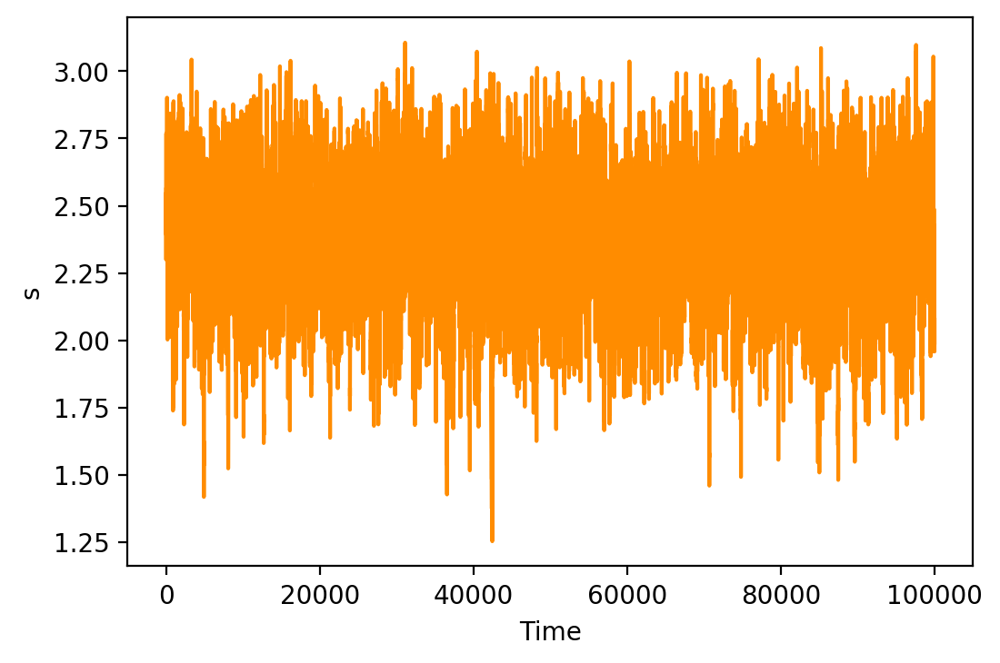

In [11]:
def plot_traj(traj):
    plt.plot(traj, c='darkorange')
    plt.xlabel('Time')
    plt.ylabel('s')
    
plot_traj(system.traj)

We can also visualize the trajectory directly. This may take some time, and more so if the trajectory gets longer.

In [12]:
def visualize_dyn(traj, stride=100, shift=2.3):
    from matplotlib import animation
    from IPython.display import HTML
    
    fig, ax = plt.subplots(1, 1)
    ax.set_xlim(-4,4)
    ax.set_ylim(-25,25)
    ax.plot(xx, U)
    
    def animate(frame):
        ax.cla()
        ax.plot(xx, U, lw=3, c='k')
        ax.plot(traj[::stride][frame], potential_energy(traj[::stride][frame])+shift, 'o',
                c='darkorange', markersize=20, markeredgecolor='k')
        
    ani = animation.FuncAnimation(fig, animate, frames=len(traj[::stride]))
        
    return ani

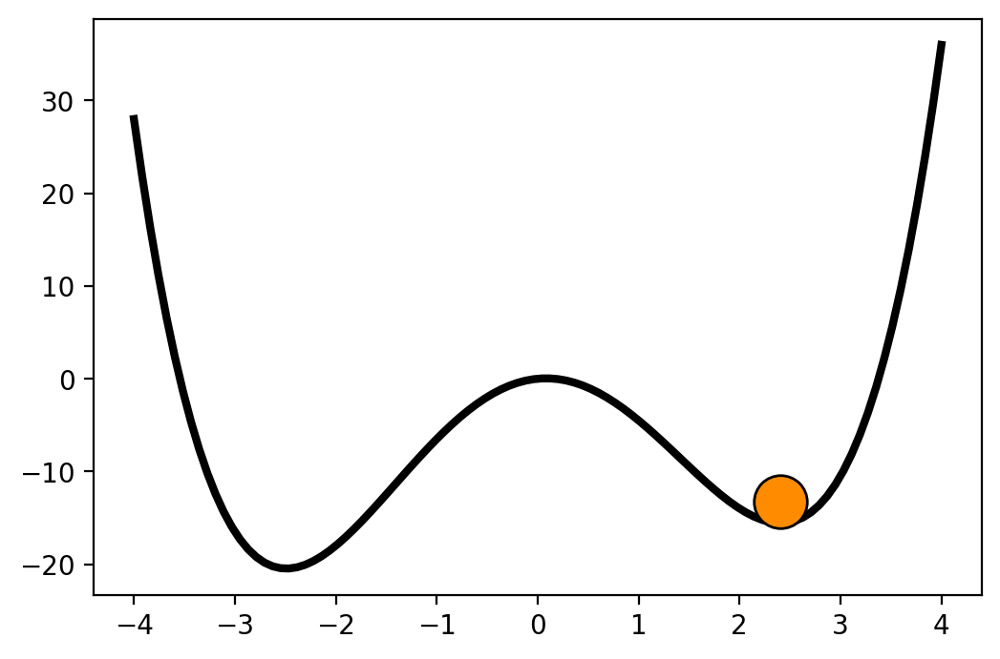

In [13]:
ani = visualize_dyn(system.traj, stride=500)

In [14]:
from IPython.display import HTML
HTML(ani.to_jshtml())

We are clearly stuck inside one basin. The probability distribution of our collective variable (the only variable present in this system, to be fair) reflects precisely this behaviour

In [16]:
def kde1D(x, grid):
    '''We use SciPy`s gaussian_kde to obtain a smooth histogram'''
    from scipy.stats import gaussian_kde
    kernel = gaussian_kde(x)
    density = kernel(grid)
    return density

P_s = kde1D(system.traj, xx)


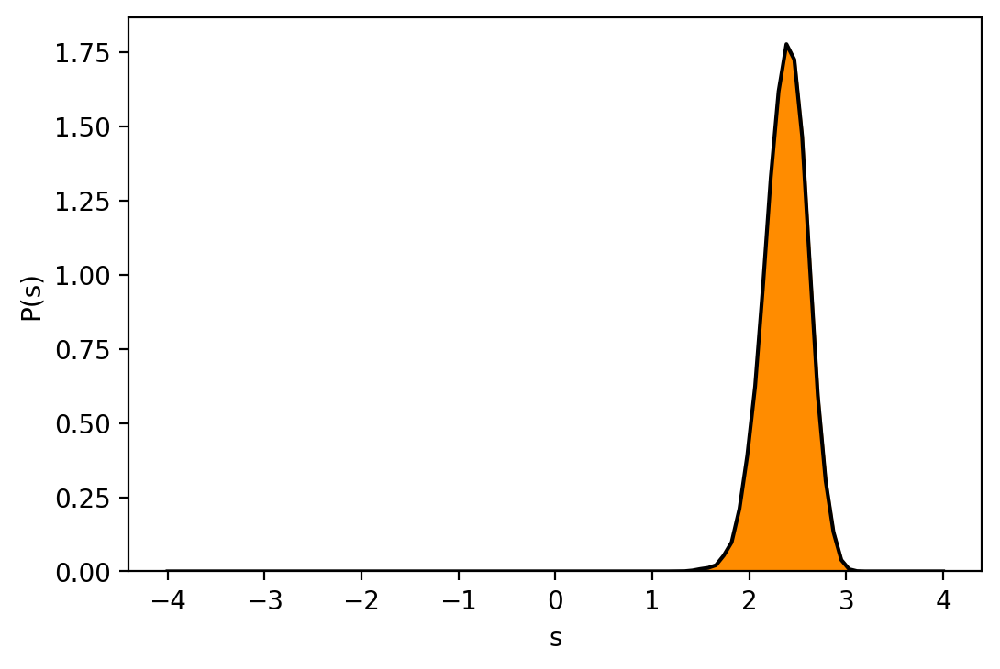

In [17]:
def plot_P_s(xx, P_s):
    plt.plot(xx, P_s, c='k')
    plt.fill_between(xx, P_s, color='darkorange')
    plt.ylim(0,)
    plt.ylabel('P(s)')
    plt.xlabel('s')

plot_P_s(xx, P_s)

Of course the corresponding free energy surface cannot be the right one

In [18]:
def convert_to_fes(P_s, kbT=kbT):
    return -kbT*np.log(P_s)

F_s = convert_to_fes(P_s, kbT=kbT)

/home/edoardo/Programs/miniconda3/envs/py3/lib/python3.7/site-packages/ipykernel_launcher.py:2: RuntimeWarning: divide by zero encountered in log
  


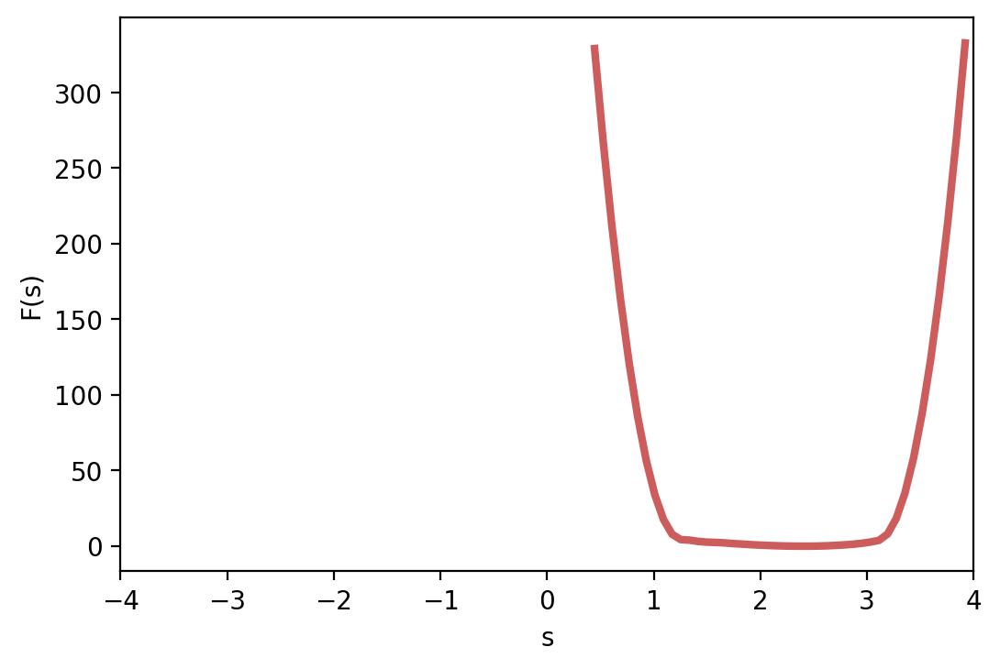

In [19]:
def plot_fes(xx, F_s, ylim=None):
    plt.plot(xx, F_s, c='indianred', lw=3)
    plt.xlim(-4,4)
    plt.ylim(ylim)
    plt.ylabel('F(s)')
    plt.xlabel('s')
    
plot_fes(xx, F_s)

## Small barrier

Now let's consider the case of a small barrier, i.e., a barrier that is not much bigger than $k_bT$. We then set $k_bT$ to a bigger value

In [20]:
# Settings for the `System`
x0 = 2.4
p0 = 0.0
m = 1.0
kbT = 1.6 # Changed here

# MD Engine settings
gamma = 1.0
dt = 5e-3
n_steps = 100000
force = force
        
# Initialize the system and the engine
system = System(x0=x0, p0=p0, m=m, kbT=kbT)
md_engine = MDEngine(langevin_gamma=gamma, dt=dt, n_steps=n_steps, force=force)


In [21]:
md_engine.run(system)

100%|██████████| 100000/100000 [00:02<00:00, 37838.07it/s]


Now we can cross the barrier

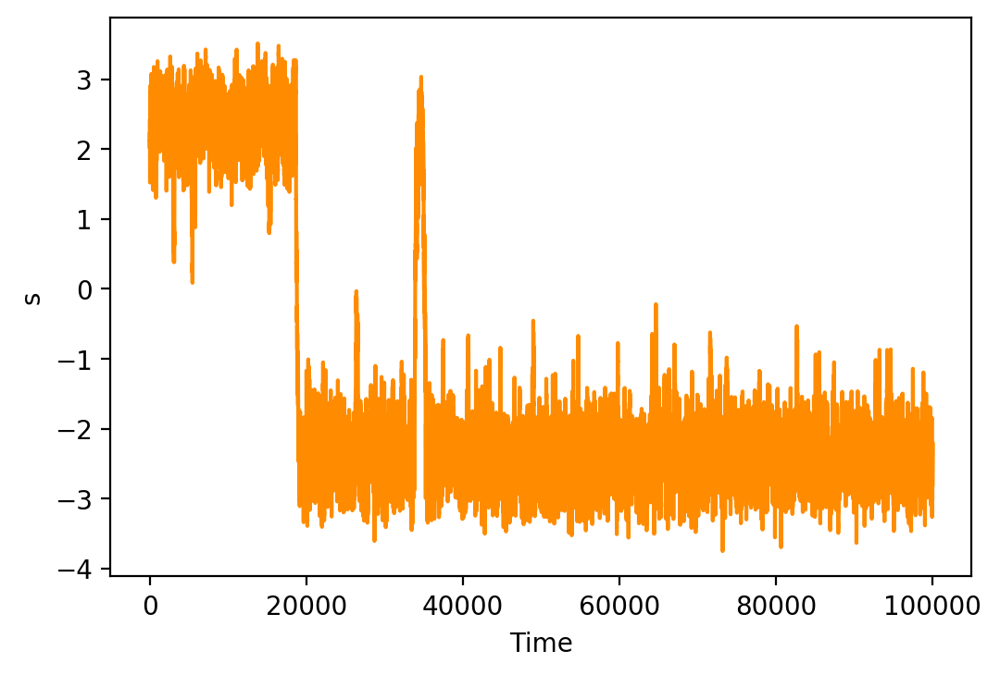

In [22]:
plot_traj(system.traj)

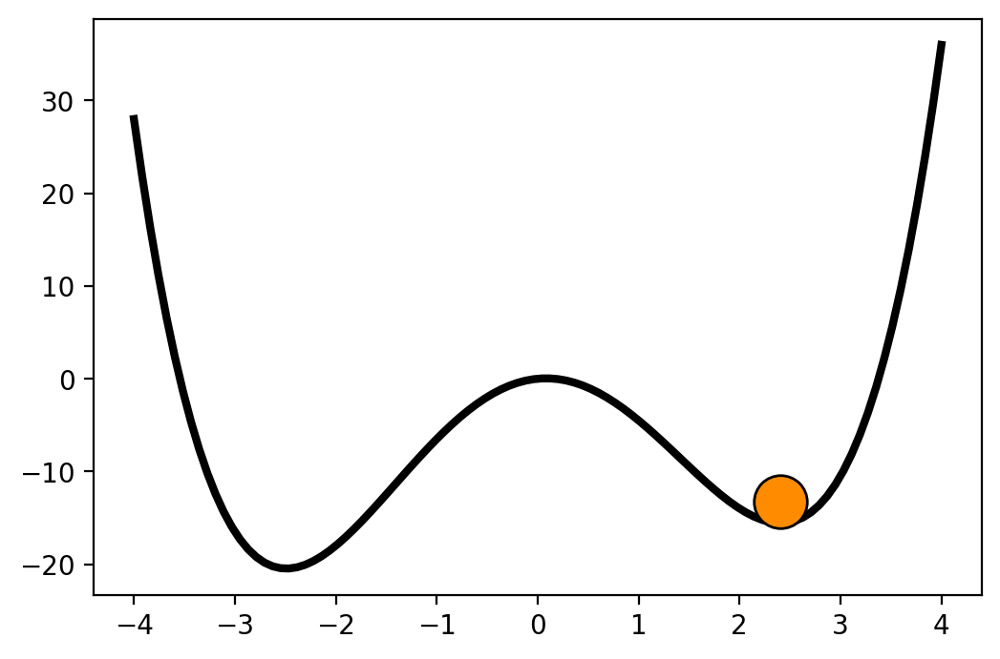

In [23]:
ani = visualize_dyn(system.traj, stride=500)

In [ ]:
from IPython.display import HTML
HTML(ani.to_jshtml())

Still, the probability distribution is wrong. This is related to the sampling time. With "infinite" sampling, the probability distribution in this case of a small barrier would be a good estimate of the real one. With limited sampling time, we end up with a bad probability distribution. The corresponding free energy surface will also be wrong, of course.

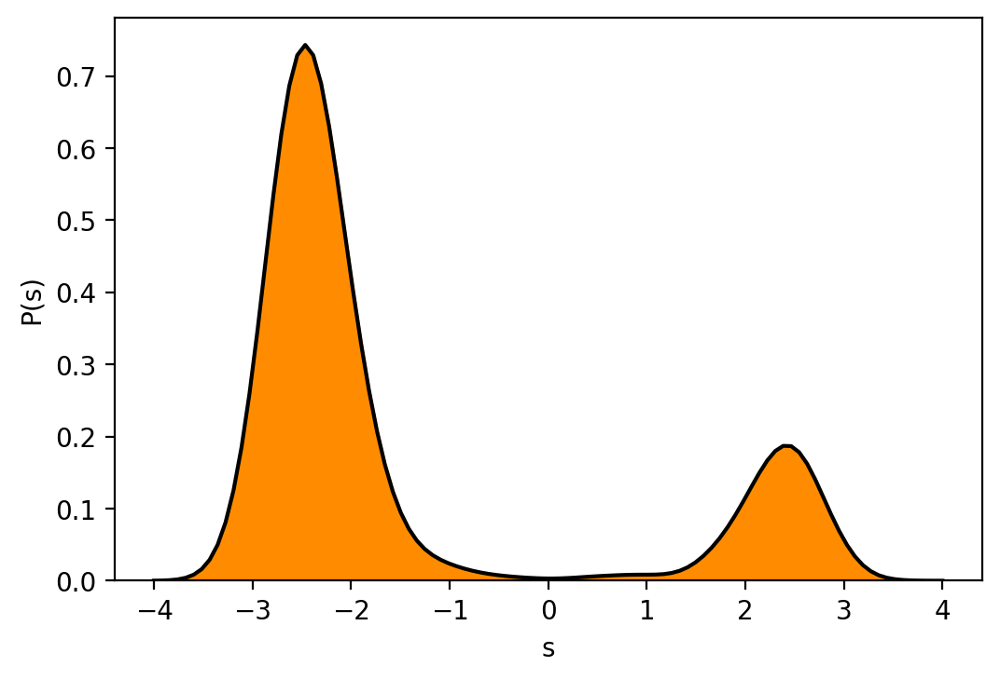

In [24]:
P_s = kde1D(system.traj, xx)
plot_P_s(xx, P_s)

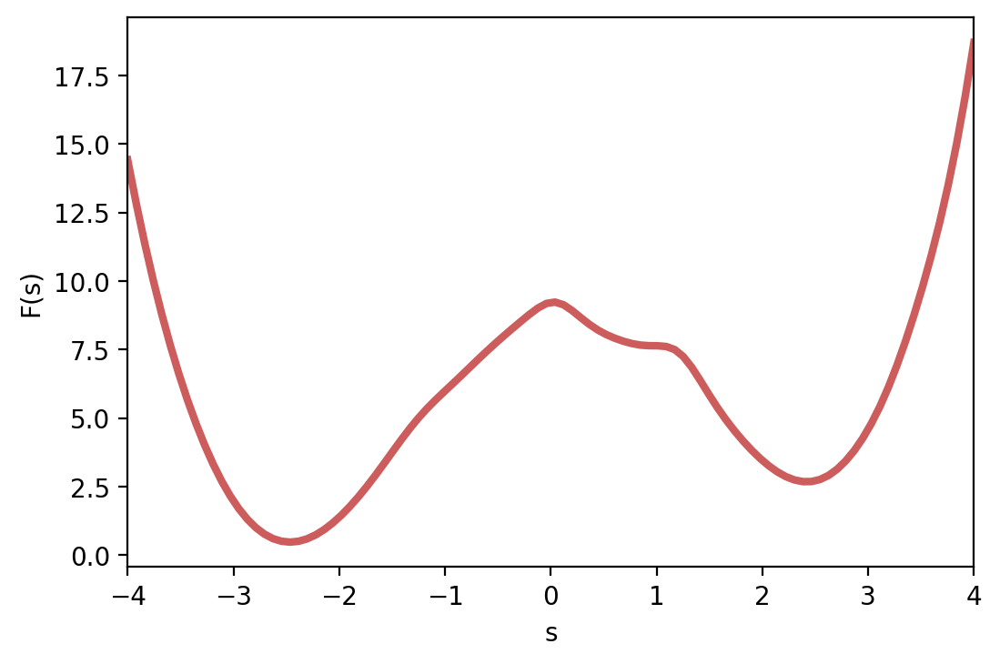

In [25]:
F_s = convert_to_fes(P_s, kbT=kbT)
plot_fes(xx, F_s)

## More sampling time (small barrier)

We still keep the barrier low, but we improve the sampling by a factor of 10. In this way, we should be able to observe a large number of transitions, and obtain a good estimate of the free energy. This situation reflects the ideal case of "infinite" sampling.

In [26]:
# Settings for the `System`
x0 = 2.4
p0 = 0.0
m = 1.0
kbT = 1.6

# MD Engine settings
gamma = 1.0
dt = 5e-3
n_steps = 1000000 # Added one zero
force = force

# Initialize the system and the engine
system = System(x0=x0, p0=p0, m=m, kbT=kbT)
md_engine = MDEngine(langevin_gamma=gamma, dt=dt, n_steps=n_steps, force=force)


In [27]:
md_engine.run(system)

100%|██████████| 1000000/1000000 [00:17<00:00, 56517.92it/s]


Here, with a lot of simulation time, we actually see a lot of transitions, and the system spends more time in the basin on the left, as it should do. 

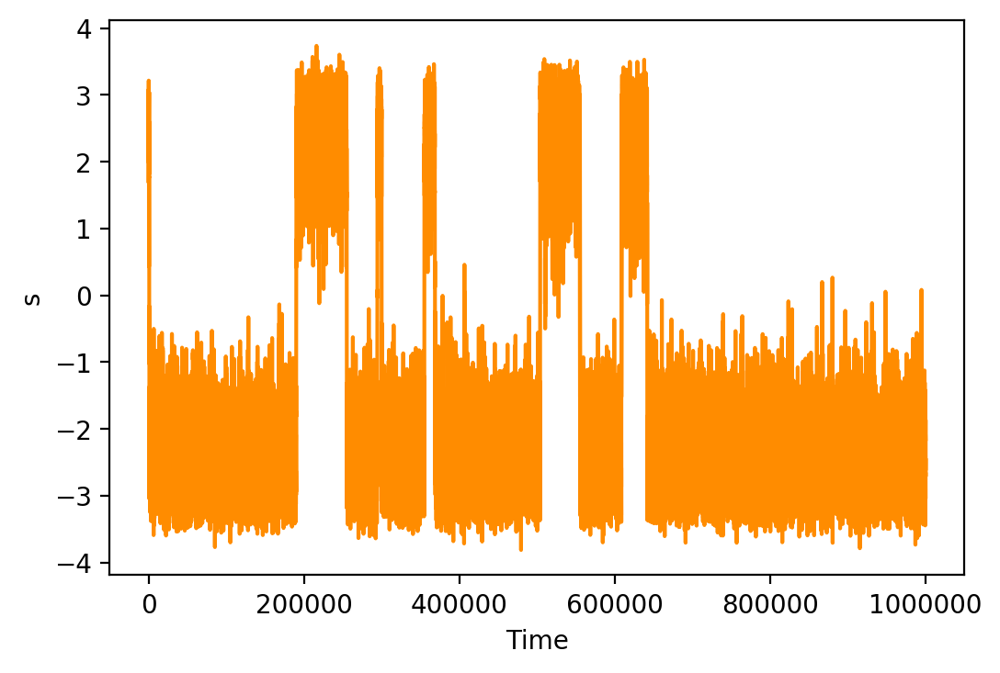

In [28]:
plot_traj(system.traj)

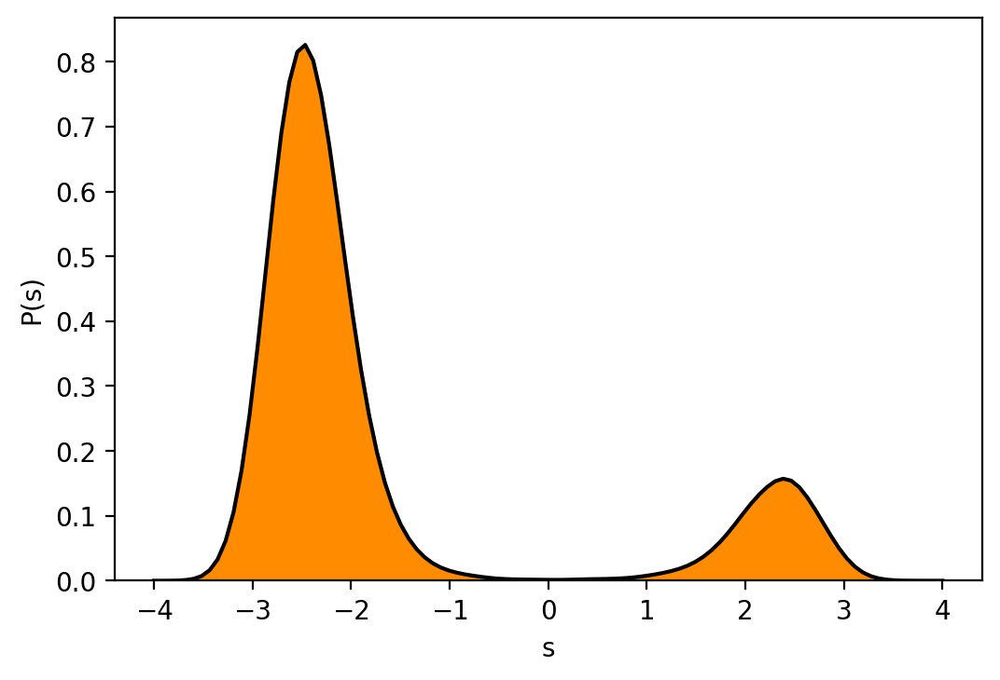

In [29]:
P_s = kde1D(system.traj, xx)
plot_P_s(xx, P_s)

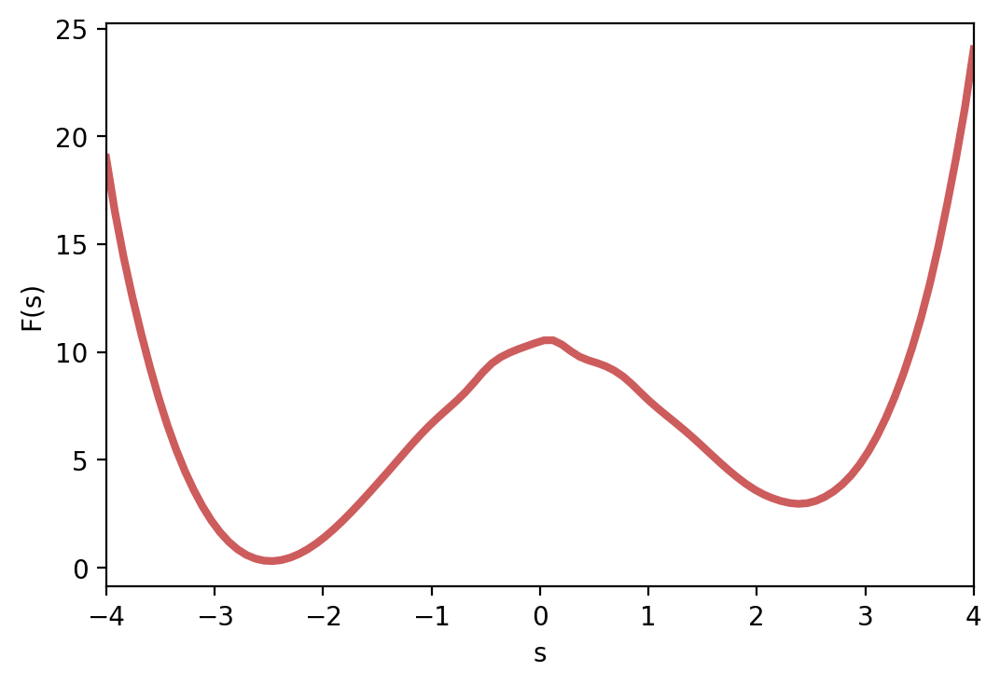

In [30]:
F_s = convert_to_fes(P_s, kbT=kbT)
plot_fes(xx, F_s)

## Umbrella Sampling


Let us consider again the case of a small barrier. We want to find a way to cross the barrier. The idea of Umbrella Sampling is to put an "umbrella" potential that helps the system to cross the barrier (note that this is not the standard way of doing Umbrella Sampling in real cases, where harmonic potentials are used to restrict the exploration to specific intervals along the CV). Let us try a guess for the umbrella potential. Given the shape of the potential energy, an umbrella with the shape of a bell should work. Not again that this kind of reasoning can be made only given that this system is very simple.

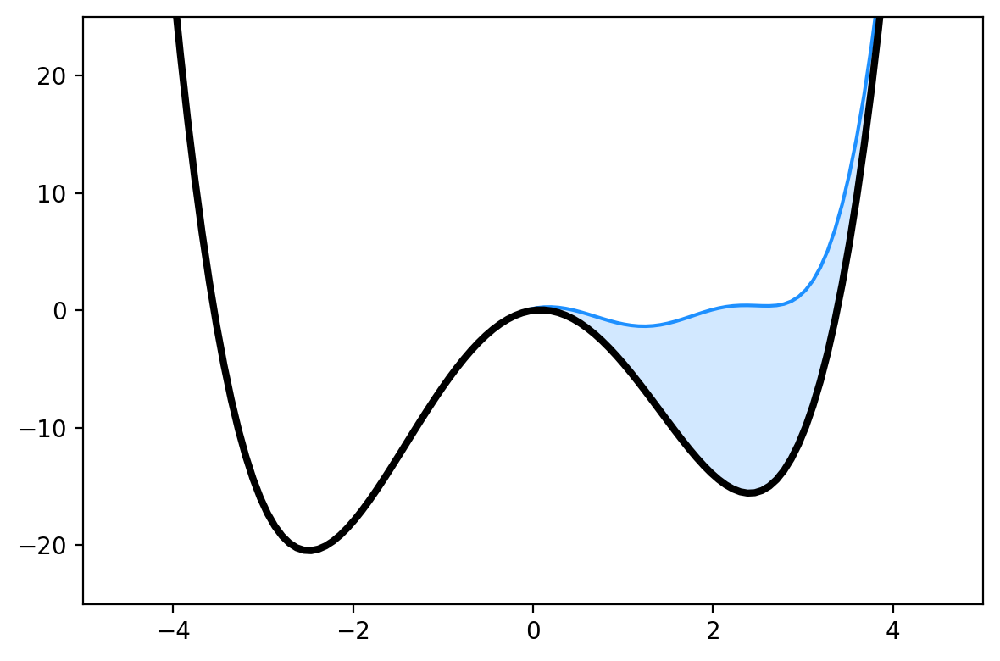

In [31]:
def gaussian(x, height, mean, beta):
    return height*np.exp(-beta*(x-mean)**2)

gau = gaussian(xx, mean=2.4, height=16.0, beta=0.8)

plot_U(xx, U)
plt.plot(xx, U+gau, c='dodgerblue', zorder=-1)
plt.fill_between(xx, U, U+gau, alpha=0.2, color='dodgerblue', zorder=-1)

This seems enough to cross the barrier. Let's add the corresponding term to the force

In [32]:
def force_gau(x, mean, height, beta):
    '''Force for a gaussian potential'''
    return 2.0*beta*(x-mean)*height*np.exp(-beta*(x-mean)**2)

def force_tot(x):
    f = force(x)
    f += force_gau(x, mean=2.4, height=16.0, beta=0.8)
    return f


We run the simulation again with this modified potential

In [33]:
# Settings for the `System`
x0 = 2.4
p0 = 0.0
m = 1.0
kbT = 0.5 

# MD Engine settings
gamma = 1.0
dt = 5e-3
n_steps = 100000
force = force
        
# Initialize the system and the engine
system = System(x0=x0, p0=p0, m=m, kbT=kbT)
md_engine = MDEngine(langevin_gamma=gamma, dt=dt, n_steps=n_steps, force=force_tot)


In [34]:
md_engine.run(system)


100%|██████████| 100000/100000 [00:02<00:00, 45943.68it/s]


In this way we can actually cross the barrier

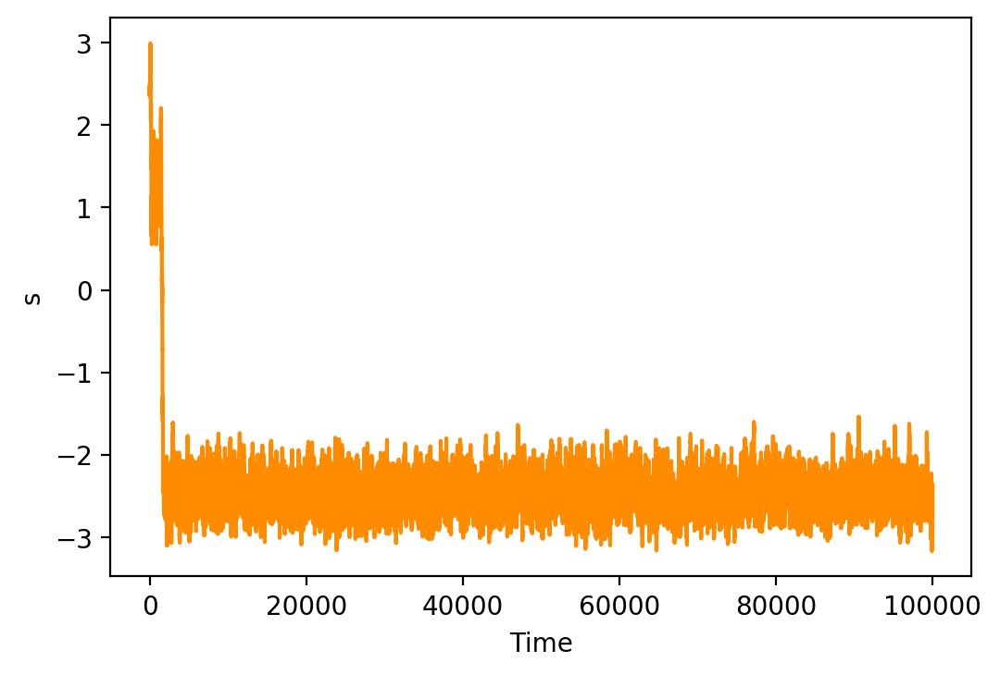

In [35]:
plot_traj(system.traj)

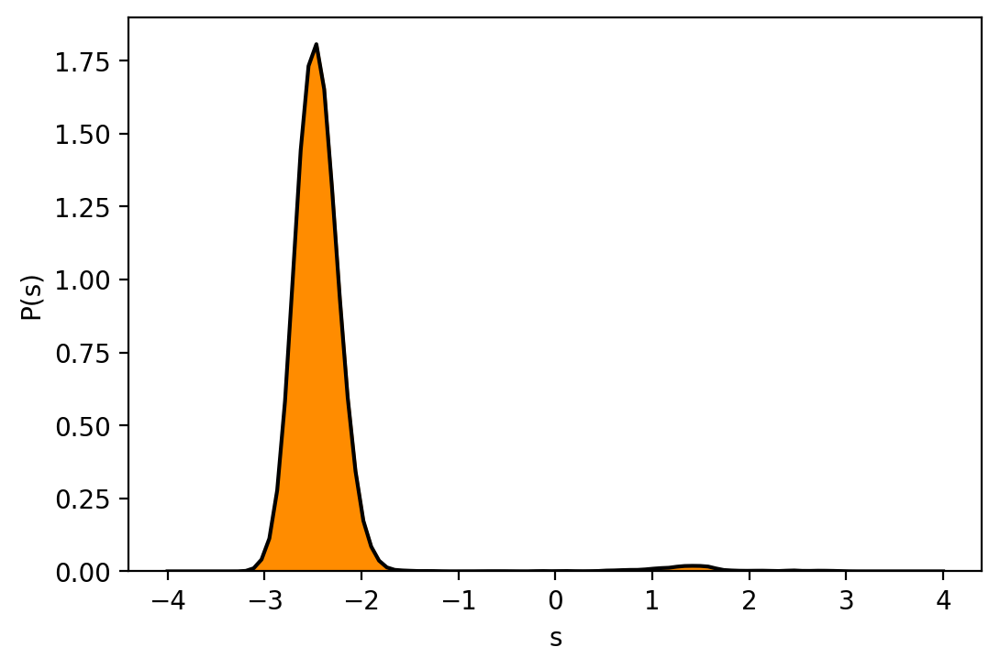

In [36]:
P_s = kde1D(system.traj, xx)
plot_P_s(xx, P_s)

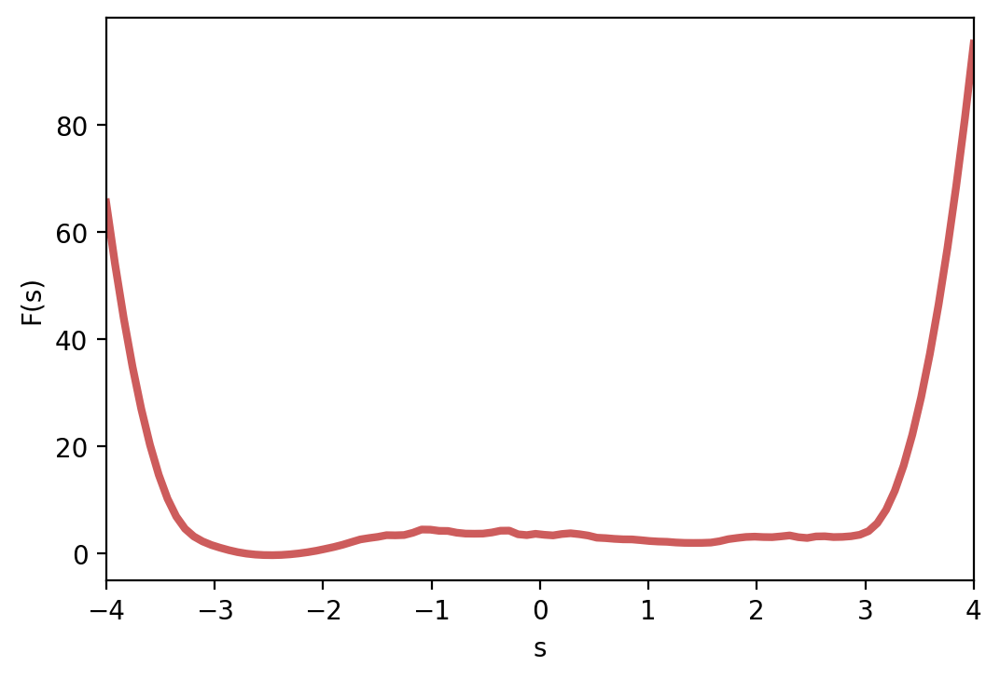

In [37]:
F_s = convert_to_fes(P_s, kbT=kbT)
plot_fes(xx, F_s)

Now that we have crossed one basin, we can do the trick again. Let us guess the next gaussian potential.

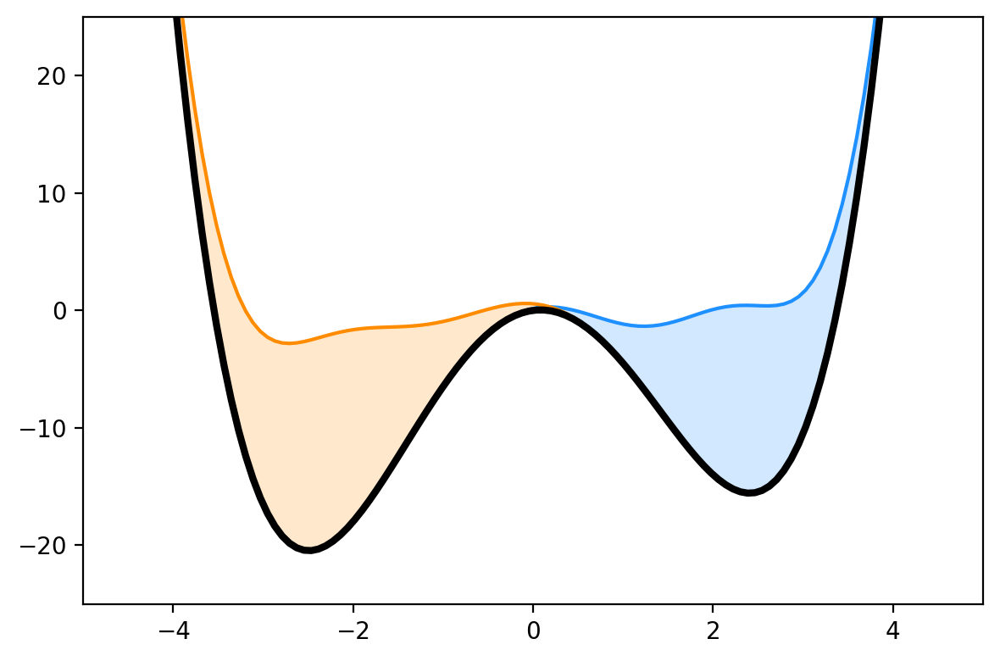

In [38]:
gau2 = gaussian(xx, mean=-2.4, height=18.0, beta=0.6)

plot_U(xx, U)
plt.plot(xx, U+gau, c='dodgerblue', zorder=-1)
plt.fill_between(xx, U, U+gau, alpha=0.2, color='dodgerblue', zorder=-1)
plt.plot(xx, U+gau2, c='darkorange', zorder=-1)
plt.fill_between(xx, U, U+gau2, alpha=0.2, color='darkorange', zorder=-1)


With this potential, we should achieve an almost free diffusion in the available space, meaning that we are sampling everything correctly.

In [39]:
def force_tot(x):
    f = force(x)
    f += force_gau(x, mean=2.4, height=16.0, beta=0.8)
    f += force_gau(x, mean=-2.4, height=18.0, beta=0.6)
    return f


In [40]:
# Settings for the `System`
x0 = 2.4
p0 = 0.0
m = 1.0
kbT = 0.5

# MD Engine settings
gamma = 1.0
dt = 5e-3
n_steps = 100000
force = force
        
# Initialize the system and the engine
system = System(x0=x0, p0=p0, m=m, kbT=kbT)
md_engine = MDEngine(langevin_gamma=gamma, dt=dt, n_steps=n_steps, force=force_tot)


In [41]:
# We run the dynamics two times in order to better show the free diffusion
for i in range(2):
    md_engine.run(system)


100%|██████████| 100000/100000 [00:02<00:00, 37668.95it/s]


Now we can diffuse (almost) freely between the two basins. They are both completely accessible. 

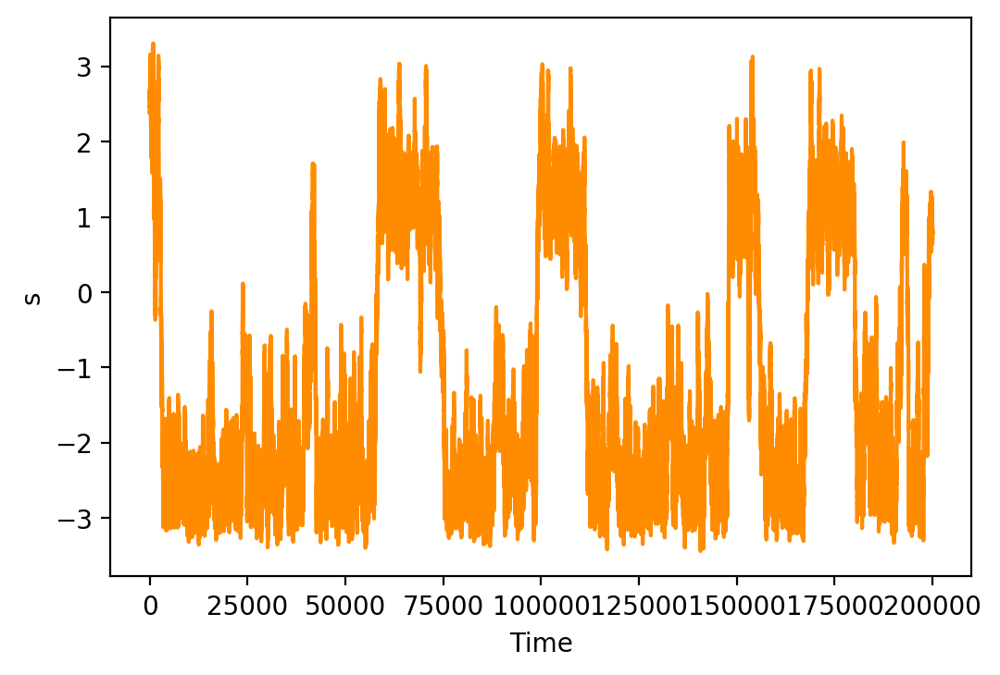

In [42]:
plot_traj(system.traj)

Note that the probability distribution of $s$ is not uniform over the whole interval, as the bias potential we are applied does not perfectly makes the resulting potential energy "flat" in the region of interest. Therefore, we have peaks in the probability distribution corresponding to the small bowls in the potential energy. Note also that this is a probability density of a biased system.

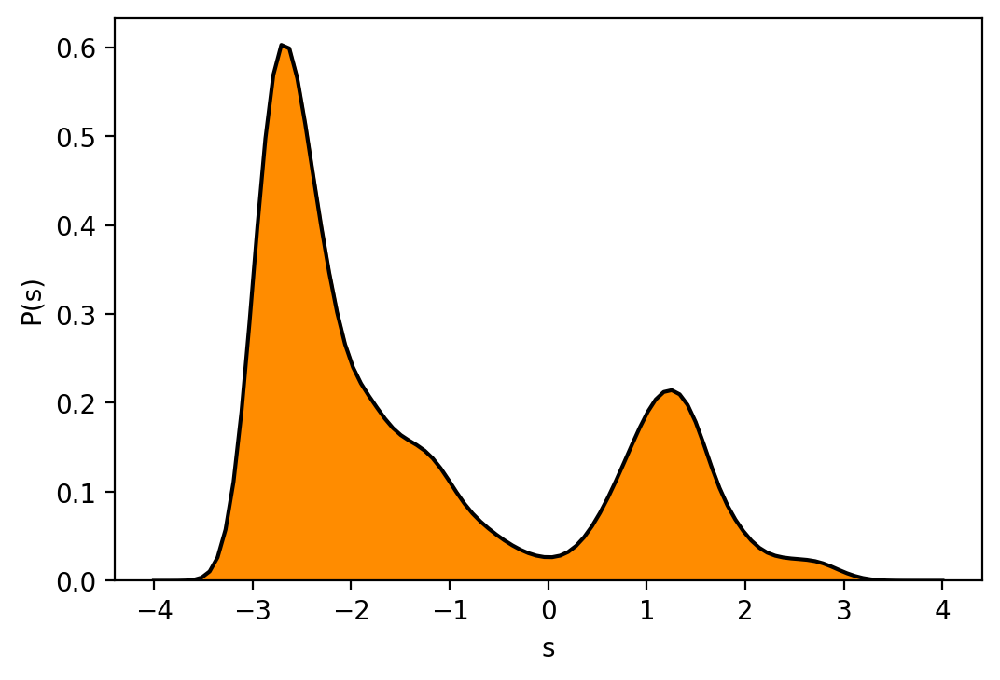

In [43]:
P_s = kde1D(system.traj, xx)
plot_P_s(xx, P_s)

As this is the probability distribution of a biased system, we can't recover the free energy of our true system by simply taking the (minus) logarithm of this quantity. Let's try to do that

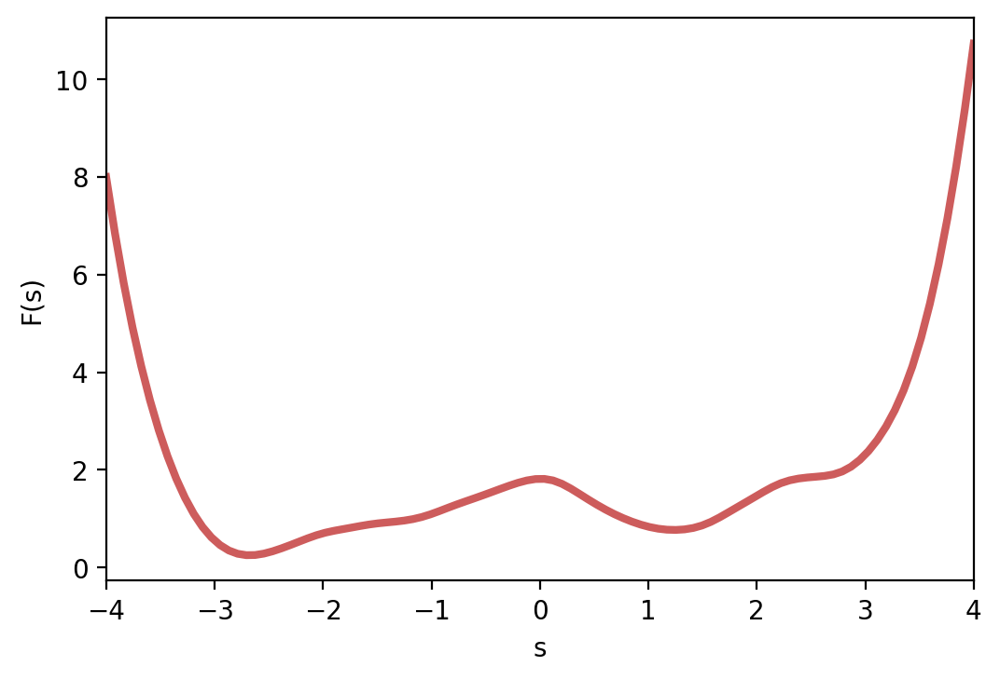

In [44]:
F_s = convert_to_fes(P_s, kbT=kbT)
plot_fes(xx, F_s)

Instead, we must use the main result of Umbrella Sampling

\begin{equation}
F(s) = F_B(s) - B(s) + C_B
\end{equation}

where we don't care about $C_B$. If we do that we get a good free energy. By sampling more and more our estimate of the free energy would become even better.

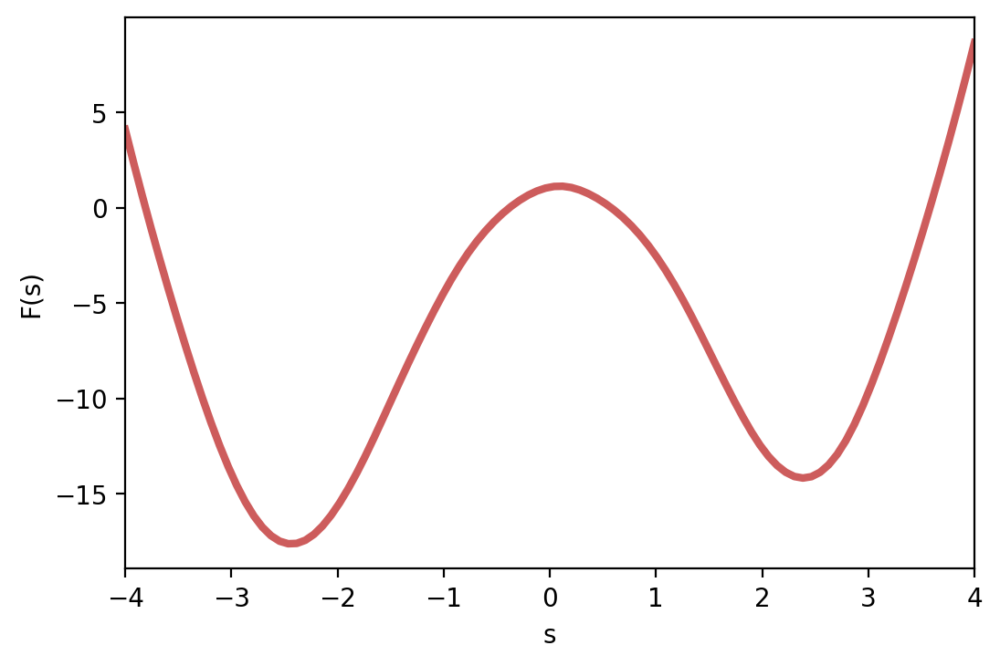

In [45]:
B_s = gau+gau2
plot_fes(xx, F_s-B_s)

In this case we have guessed the umbrella potential for each of the two basins. An alternative is to use Adaptive Umbrella Sampling, where instead of guessing the potential one runs a small MD simulation, computes the $P(s)$ in that simulation, converts it to a $F(s)$, and uses $B(s)=-F(s)$ as a bias potential for another small simulation. Then repeats the process, iteratively building up $B(s)$. We do not implement such a procedure here. Instead, we skip directly to metadynamics.

## Metadynamics

Let us now use metadynamics (not the well tempered version). In order to do so we must modify our `MDEngine` class and implement a simple version of metadynamics. 

In [46]:
class Metadynamics():
    
    def __init__(self, pace, height, sigma, grid_min, grid_max, grid_bins,
                 biasfactor=None, temp=None, track_history=True):
        self.pace = pace
        self.height = height
        self.sigma = sigma
        self.biasfactor = biasfactor
        self.temp = temp
        
        # Very minor check on the well-tempered metadynamics.
        # If the temperature is provided, but the biasfactor is not,
        # the temperature is ignored and plain metadynamics is run.
        # If the biasfactor is given (requiring the well-tempered version)
        # the temperature must be provided
        if self.biasfactor is not None:
            if self.temp is None: raise ValueError('Biasfactor and temperature must be specified together.')
            self.DT = self.temp*(self.biasfactor-1.)
    
        # Grid for storing the bias
        self.grid_min = grid_min
        self.grid_max = grid_max
        self.grid_bins = grid_bins
        self.grid = np.linspace(grid_min, grid_max, grid_bins)
        self.bias = np.zeros(self.grid.shape)
        
        # Track the history if required to do so.
        # This keeps in memory the positions of the added Gaussians,
        # and the value of the scaling factor
        self.track_history = track_history
        if self.track_history: self.history = list()
        
    def add_gaussian(self, x):
        '''Adds a Gaussian to the bias'''
        
        # If normal metadynamics, the height is not rescaled
        # If well-tempered metadynamics, the height is rescaled
        # according to the deposited bias
        if self.biasfactor is None:
            scale = 1.0
        else:
            pos = np.argmin(x > self.grid)
            bias = (self.bias[pos] + self.bias[pos-1])*0.5
            scale = np.exp(-bias/self.DT)
            
        # Add a Gaussian to the bias
        self.bias += self.height*scale*np.exp(-(0.5/self.sigma**2)*(self.grid - x)**2)
        
        # Also update the history if required
        if self.track_history:
            self.history.append([x, scale])
        
    def bias_force(self, x):
        '''Computes the force deriving from the bias numerically'''
        pos = np.argmin(x >  self.grid)
        dB_ds = (self.bias[pos] - self.bias[pos-1])/(self.grid[pos] - self.grid[pos-1])
        return -dB_ds
    
    def fes(self):
        '''Computes the free energy from the bias'''
        
        # If normal metadynamics, the free energy corresponds
        # to the bias with a negative sign.
        # If well-tempered, you have to scale the bias
        if self.biasfactor is None:
            return -self.bias
        else:
            return -(self.biasfactor/(self.biasfactor-1))*self.bias


class MDEngine():
    
    def __init__(self, langevin_gamma, dt, n_steps, force, metad=None):
        self.langevin_gamma = langevin_gamma
        self.dt = dt
        self.n_steps = n_steps
        self.force = force
        # Tell the engine if we are activating metadynamics
        self.metad = metad
        
    def run(self, system):
        '''Run the simulation for the provided system'''
        from tqdm import tqdm
        
        # Initialize the variables and compute
        # the initial force.
        self._x = system.x0
        self._p = system.p0
        self._f = self.force(system.x0)
        self._m = system.m
        self._kbT = system.kbT
        
        # Run the dynamics
        for step in tqdm(range(self.n_steps)):
            
            # If metadynamics is active, add a Gaussian
            # every metad.pace steps
            if self.metad is not None:
                if step % self.metad.pace == 0:
                    self.metad.add_gaussian(self._x)
                    
            # Langevin step
            self.langevin_step()
            
            # Also update the system trajectory
            system.traj.append(self._x)
            
    def langevin_step(self):
        '''Langevin step using BAOAB integration (see Allen and Tildesley)'''
        self._p = self._p + 0.5*self.dt*self._f           # B
        self._x = self._x + 0.5*self.dt*self._p/self._m   # A
        self._p_r = np.exp(-self.langevin_gamma)*self._p + np.sqrt(1-np.exp(-2*self.langevin_gamma*self.dt))*np.sqrt(self._m*self._kbT)*np.random.normal() # O
        self._x = self._x + 0.5*self._p_r/self._m         # A
        self._f = self.force(self._x)
        # If metadynamics is active, add the force
        # term that comes from the bias
        if self.metad is not None:
            self._f += self.metad.bias_force(self._x)
        self._p = self._p_r + 0.5*self.dt*self._f         # B


In [47]:
# Settings for the `System`
x0 = 2.4
p0 = 0.0
m = 1.0
kbT = 0.5

# Metadynamics parameters
pace = 100
height = 0.2
sigma = 0.3
grid_min = -8
grid_max = 8
grid_bins = 100

# MD Engine settings
gamma = 1.0
dt = 5e-3
n_steps = 10000
force = force

        
# Initialize the system and the engine
system = System(x0=x0, p0=p0, m=m, kbT=kbT)
metad = Metadynamics(pace=pace, height=height, sigma=sigma, grid_min=grid_min, grid_max=grid_max, grid_bins=grid_bins)
md_engine = MDEngine(langevin_gamma=gamma, dt=dt, n_steps=n_steps, force=force, metad=metad)

In [59]:
md_engine.run(system)

100%|██████████| 10000/10000 [00:00<00:00, 22139.03it/s]


Now we look at the `metad.history` in order to track every added Gaussian, and we plot them over the potential energy. We see that the bias has covered all of our potential energy, so that we have free diffusion of the system, after an initial transient

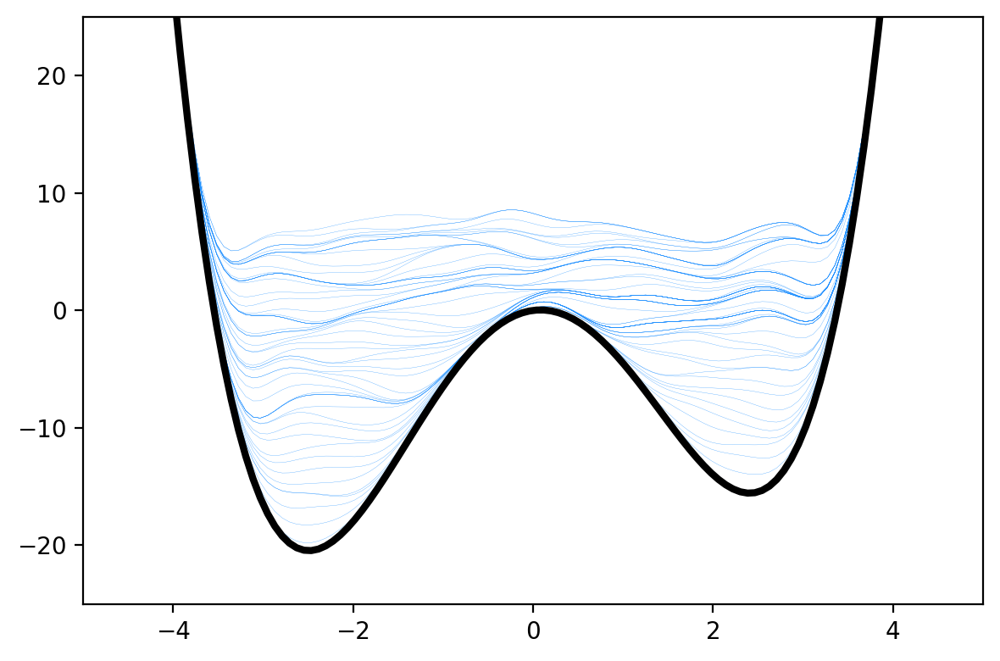

In [60]:
def plot_metad_history(metad, stride):
    '''Plot the Gaussians added over the simulation over U.'''
    plot_U(xx, U)
    U_b = U
    for step,histo in enumerate(metad.history):
        mean = histo[0] # center of the Gaussian
        scale = histo[1] # scaling factor of the height of the Gaussian
        U_b = U_b + gaussian(xx, height=metad.height*scale, mean=mean, beta=1./(2*metad.sigma**2))
        if step % stride == 0:
            plt.plot(xx, U_b, c='dodgerblue', lw=1e-1, zorder=-1)
       
    
plot_metad_history(metad, stride=10)

Let's see the diffusion

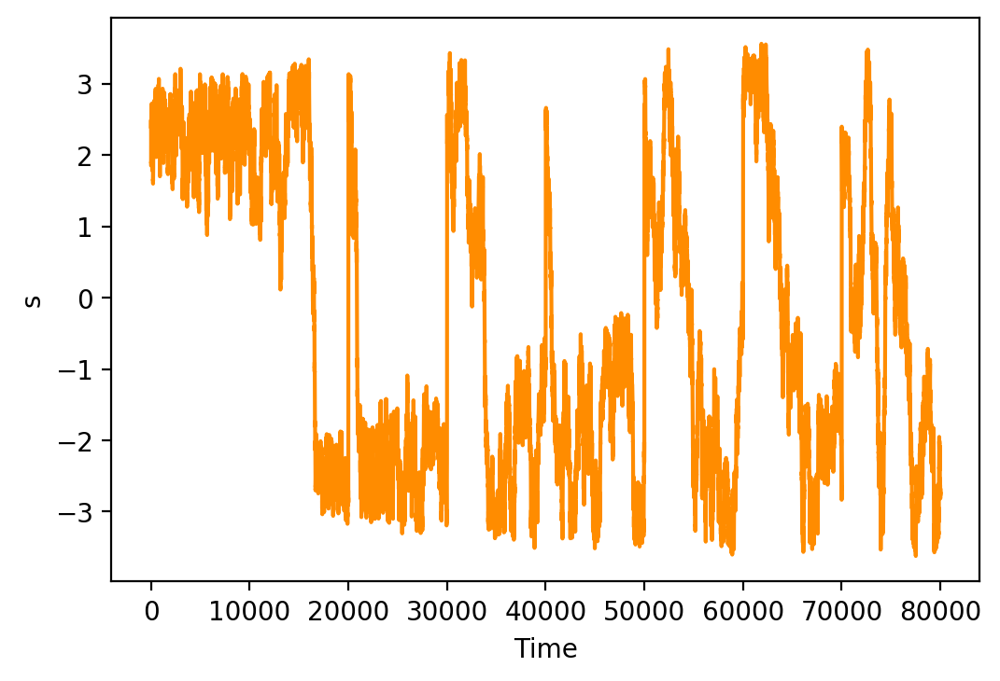

In [61]:
plot_traj(system.traj)

Finally, we obtain the free energy surface directly from the bias

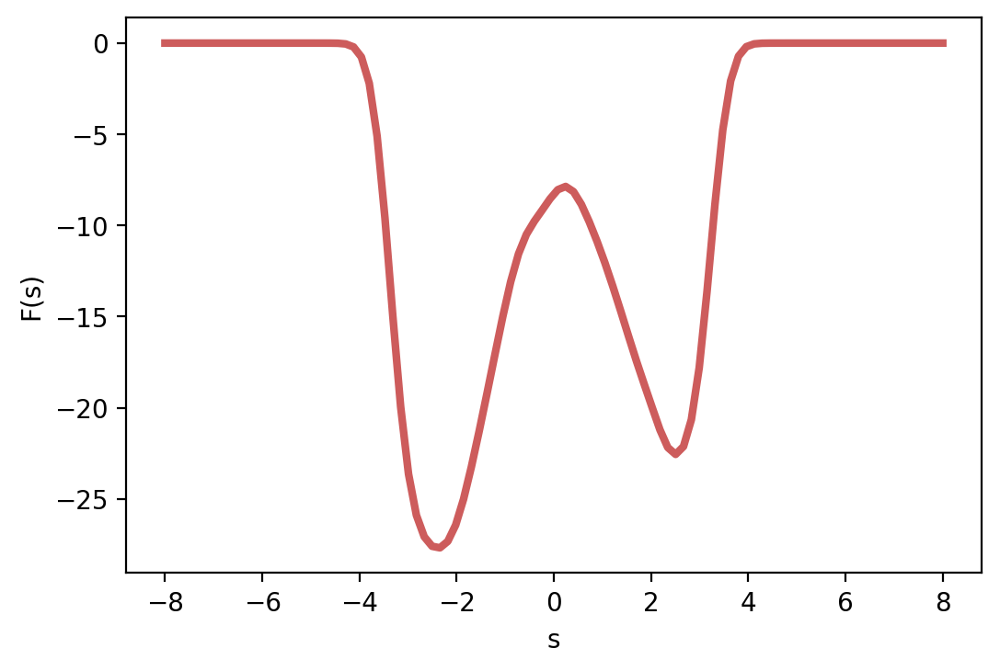

In [62]:
def plot_metad_fes(metad):
    plt.plot(metad.grid, metad.fes(), lw=3.0, c='indianred')
    plt.xlabel('s')
    plt.ylabel('F(s)')
    
plot_metad_fes(metad)

Now for the well-tempered version. We can activate well-tempered metadynamics by providing our `Metadynamics` class with the bias factor and the temperature of the system. The algorithm will add Gaussians, but the height of each Gaussian is rescaled according to the bias that has been already deposited. This should provide us with a smoother filling of the free energy. Furthermore, the Gaussians will eventually have "zero" height, so that, after a transient time, the system will not explore the free energy further. If the biasfactor is too low, then, there may be barriers that can not be overcome.

In [77]:
# Settings for the `System`
x0 = 2.4
p0 = 0.0
m = 1.0
kbT = 0.5

# Metadynamics parameters
pace = 100
height = 0.2
sigma = 0.3
grid_min = -8
grid_max = 8
grid_bins = 100
# well-tempered parameters
biasfactor = 20
temp = kbT

# MD Engine settings
gamma = 1.0
dt = 5e-3
n_steps = 100000
force = force

        
# Initialize the system and the engine
system = System(x0=x0, p0=p0, m=m, kbT=kbT)
metad = Metadynamics(pace=pace, height=height, sigma=sigma, grid_min=grid_min, grid_max=grid_max, grid_bins=grid_bins,
                     biasfactor=biasfactor, temp=temp)
md_engine = MDEngine(langevin_gamma=gamma, dt=dt, n_steps=n_steps, force=force, metad=metad)

In [81]:
md_engine.run(system)


100%|██████████| 100000/100000 [00:03<00:00, 29230.10it/s]


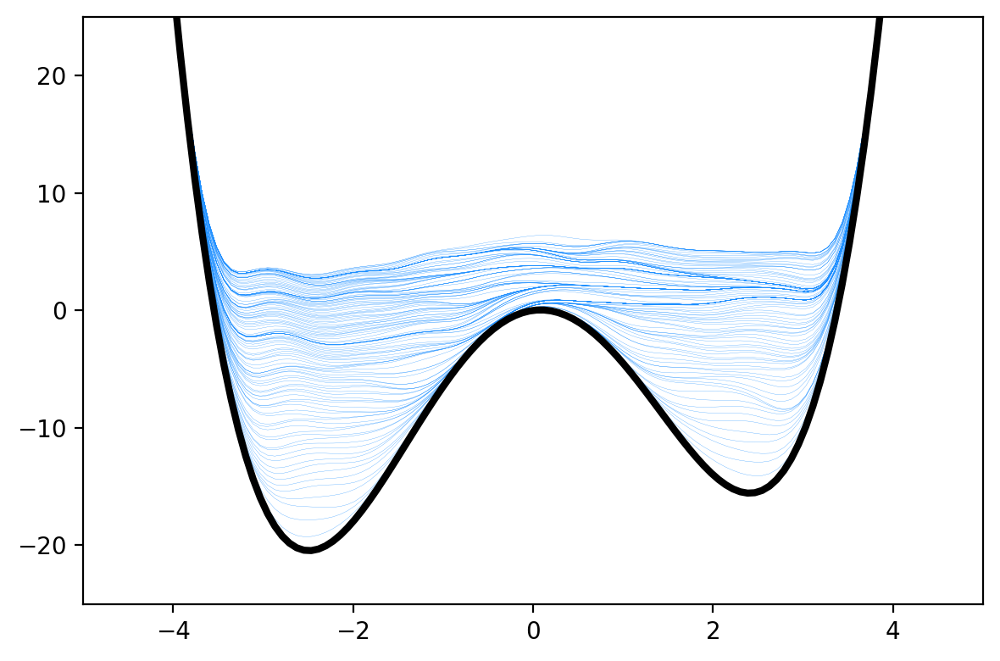

In [82]:
plot_metad_history(metad, stride=10)

We can look again at the diffusion in CV space and the free energy

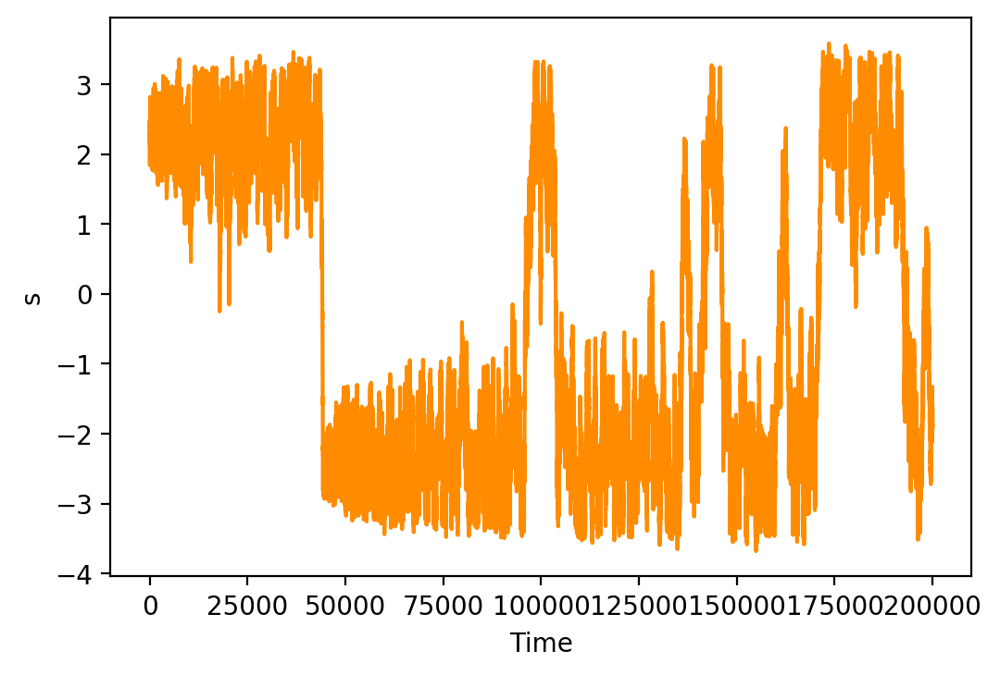

In [83]:
plot_traj(system.traj)


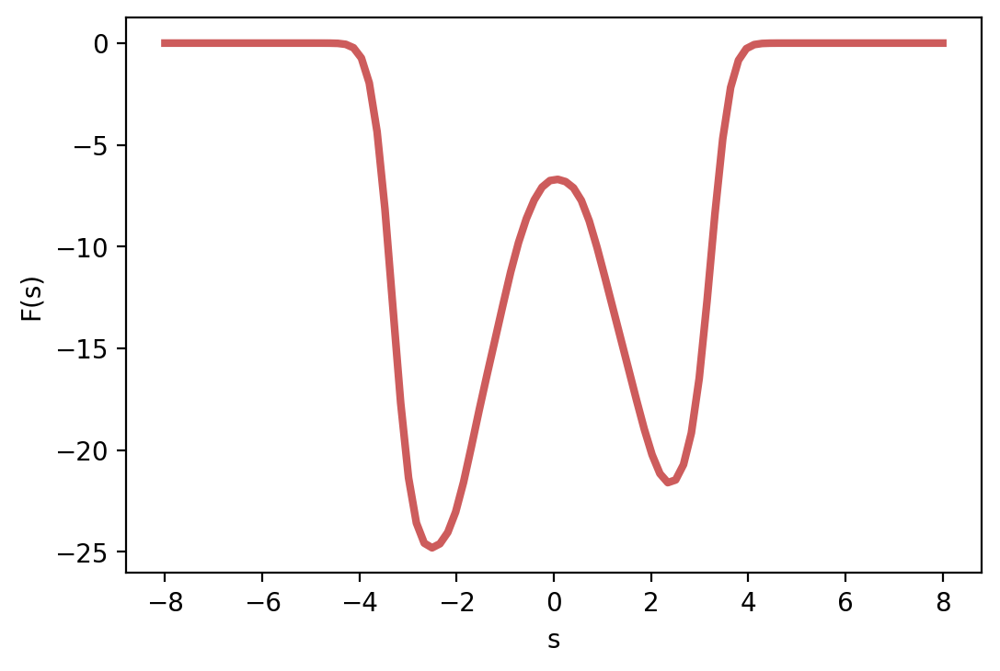

In [84]:
plot_metad_fes(metad)